<a href="https://colab.research.google.com/github/ManuelGerardo/Navegacion_Autonoma/blob/main/Behavioral_Cloning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [33]:
import numpy as np
import matplotlib.pyplot as plt
import keras
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense
import cv2
import pandas as pd
import random
import os
import ntpath
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import matplotlib.image as mpimg
from imgaug import augmenters as iaa
import tensorflow as tf
from google.colab import drive
import zipfile
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [34]:
datadir = "/content/drive/MyDrive/"
zip_path = "/content/drive/MyDrive/IMG.zip"
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']

data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)

data.head()

<ipython-input-34-1dcc70952ecc>:6: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


,center,left,right,steering,throttle,reverse,speed
0,E:\Simulator\Images\IMG\center_2023_06_23_16_43_38_391.jpg,E:\Simulator\Images\IMG\left_2023_06_23_16_43_38_391.jpg,E:\Simulator\Images\IMG\right_2023_06_23_16_43_38_391.jpg,0.0,0.000000,0,0.000012
1,E:\Simulator\Images\IMG\center_2023_06_23_16_43_38_459.jpg,E:\Simulator\Images\IMG\left_2023_06_23_16_43_38_459.jpg,E:\Simulator\Images\IMG\right_2023_06_23_16_43_38_459.jpg,0.0,0.000000,0,0.000006
2,E:\Simulator\Images\IMG\center_2023_06_23_16_43_38_528.jpg,E:\Simulator\Images\IMG\left_2023_06_23_16_43_38_528.jpg,E:\Simulator\Images\IMG\right_2023_06_23_16_43_38_528.jpg,0.0,0.000000,0,0.000006
3,E:\Simulator\Images\IMG\center_2023_06_23_16_43_38_597.jpg,E:\Simulator\Images\IMG\left_2023_06_23_16_43_38_597.jpg,E:\Simulator\Images\IMG\right_2023_06_23_16_43_38_597.jpg,0.0,0.056172,0,0.019206
4,E:\Simulator\Images\IMG\center_2023_06_23_16_43_38_666.jpg,E:\Simulator\Images\IMG\left_2023_06_23_16_43_38_666.jpg,E:\Simulator\Images\IMG\right_2023_06_23_16_43_38_666.jpg,0.0,0.224375,0,0.137626


In [28]:
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall('/content/drive/MyDrive/Images_Training')  # Extrae los datos en la carpeta '/content/datos'

In [36]:
def path_leaf(path):
    # : This module provides os.path functionality on Windows platforms.
    # : ntpath.split() gives the file name and folder path
    head, tail = ntpath.split(path)
    return tail

data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2023_06_23_16_43_38_391.jpg,left_2023_06_23_16_43_38_391.jpg,right_2023_06_23_16_43_38_391.jpg,0.0,0.000000,0,0.000012
1,center_2023_06_23_16_43_38_459.jpg,left_2023_06_23_16_43_38_459.jpg,right_2023_06_23_16_43_38_459.jpg,0.0,0.000000,0,0.000006
2,center_2023_06_23_16_43_38_528.jpg,left_2023_06_23_16_43_38_528.jpg,right_2023_06_23_16_43_38_528.jpg,0.0,0.000000,0,0.000006
3,center_2023_06_23_16_43_38_597.jpg,left_2023_06_23_16_43_38_597.jpg,right_2023_06_23_16_43_38_597.jpg,0.0,0.056172,0,0.019206
4,center_2023_06_23_16_43_38_666.jpg,left_2023_06_23_16_43_38_666.jpg,right_2023_06_23_16_43_38_666.jpg,0.0,0.224375,0,0.137626


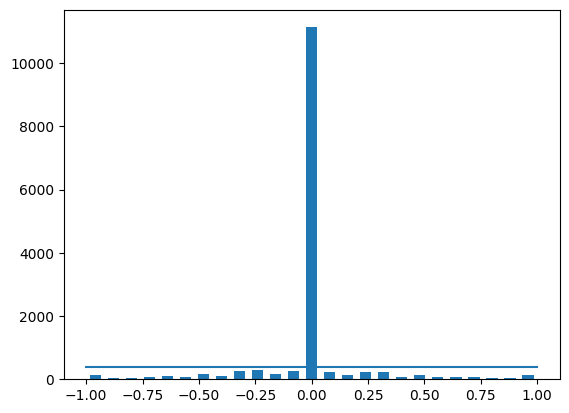

In [37]:
num_bins = 25

samples_per_bin = 400

hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

total data: 14325
removed: 10733
remaining: 3592


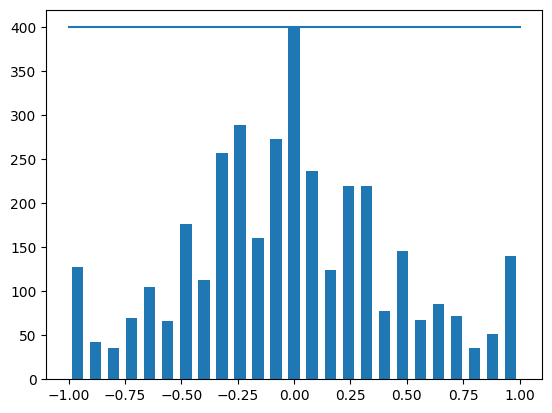

In [38]:
print('total data:', len(data))
remove_list = []
for j in range(num_bins):
    list_ = []
    for i in range(len(data['steering'])):
        if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
            list_.append(i)
    list_ = shuffle(list_)
    list_ = list_[samples_per_bin:]
    remove_list.extend(list_)

print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [43]:
print(data.iloc[1])
def load_img_steering(datadir, df):
    image_path = []
    steering = []
    for i in range(len(data)):
        indexed_data = data.iloc[i]
        center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
        image_path.append(os.path.join(datadir, center.strip()))
        steering.append(float(indexed_data[3]))
    image_paths = np.asarray(image_path)
    steerings = np.asarray(steering)
    return image_paths, steerings

image_paths, steerings = load_img_steering(datadir + 'Images_Training/IMG', data)

center      center_2023_06_23_16_43_39_560.jpg
left        left_2023_06_23_16_43_39_560.jpg  
right       right_2023_06_23_16_43_39_560.jpg 
steering    0.0                               
throttle    1.0                               
reverse     0                                 
speed       9.421784                          
Name: 17, dtype: object


In [44]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 2873
Valid Samples: 719


Text(0.5, 1.0, 'Validation set')

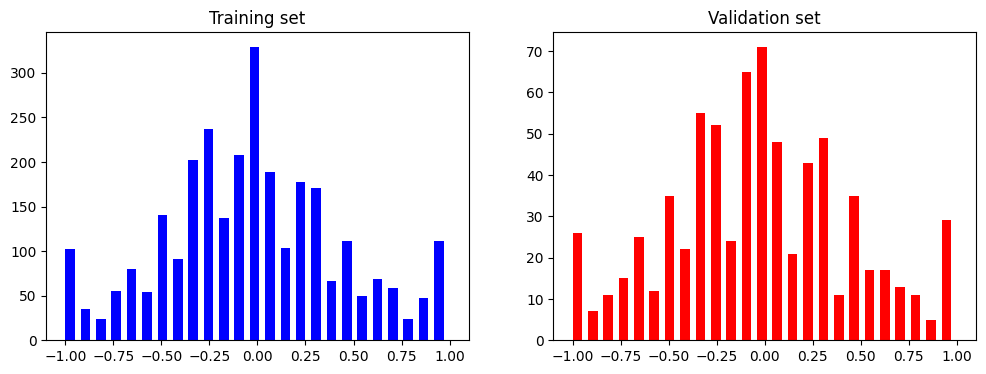

In [45]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

Text(0.5, 1.0, 'Zoomed Image')

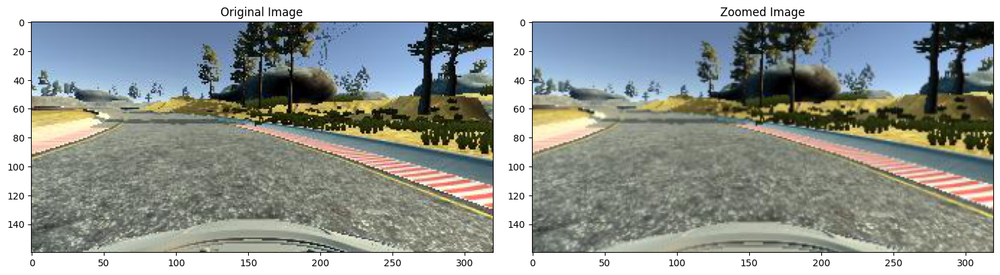

In [46]:
def zoom(image):
    zoom = iaa.Affine(scale=(1, 1.3))
    image = zoom.augment_image(image)
    return image


image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

Text(0.5, 1.0, 'Panned Image')

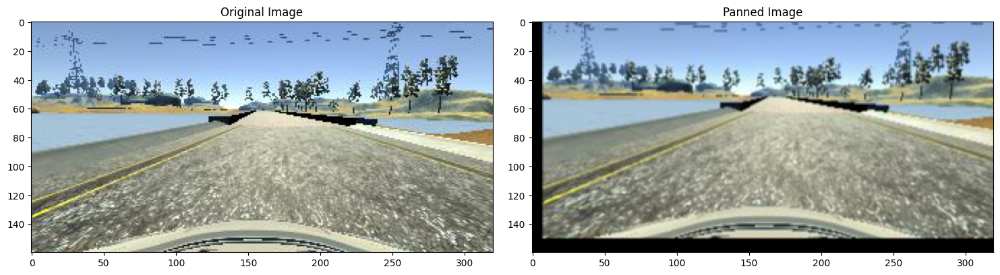

In [47]:
def pan(image):
    pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
    image = pan.augment_image(image)
    return image


image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brightness altered image ')

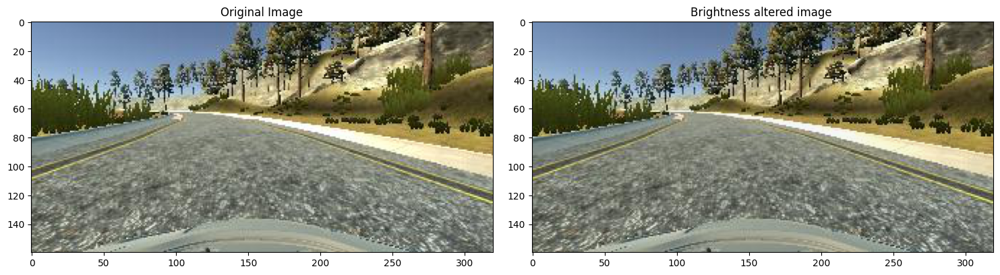

In [48]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.5500001')

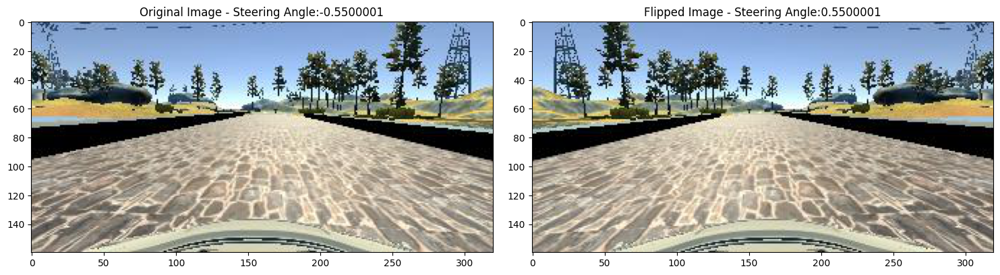

In [49]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle


random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]


original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

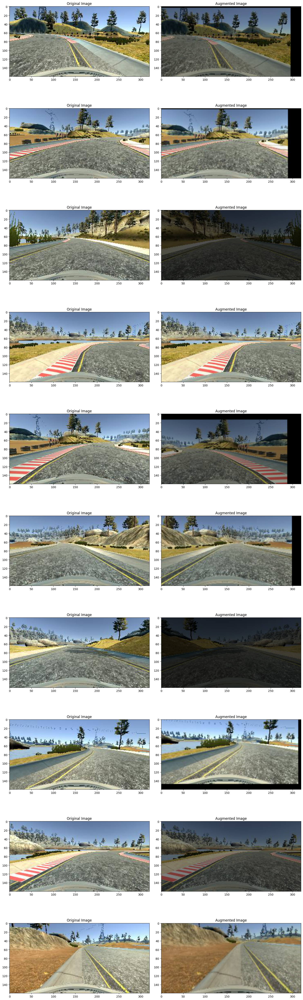

In [50]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
        image = pan(image)
    if np.random.rand() < 0.5:
        image = zoom(image)
    if np.random.rand() < 0.5:
        image = img_random_brightness(image)
    if np.random.rand() < 0.5:
        image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle


ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
    randnum = random.randint(0, len(image_paths) - 1)
    random_image = image_paths[randnum]
    random_steering = steerings[randnum]

    original_image = mpimg.imread(random_image)
    augmented_image, steering = random_augment(random_image, random_steering)

    axs[i][0].imshow(original_image)
    axs[i][0].set_title("Original Image")

    axs[i][1].imshow(augmented_image)
    axs[i][1].set_title("Augmented Image")

Text(0.5, 1.0, 'Preprocessed Image')

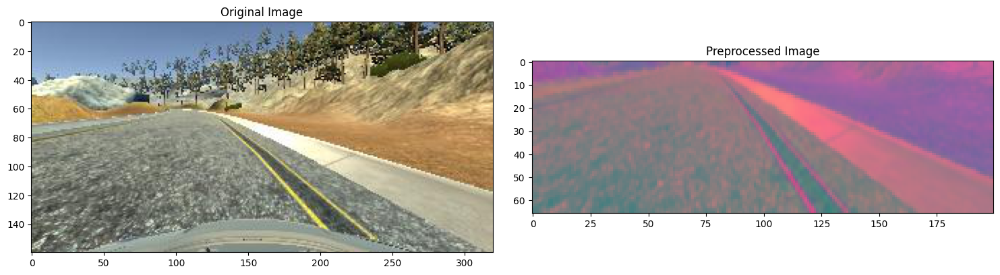

In [51]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img, (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [52]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):
    while True:
        batch_img = []
        batch_steering = []

        for i in range(batch_size):
            random_index = random.randint(0, len(image_paths) - 1)

            if istraining:
                im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
            else:
                im = mpimg.imread(image_paths[random_index])
                steering = steering_ang[random_index]

            im = img_preprocess(im)
            batch_img.append(im)
            batch_steering.append(steering)
        yield (np.asarray(batch_img), np.asarray(batch_steering))


Text(0.5, 1.0, 'Validation Image')

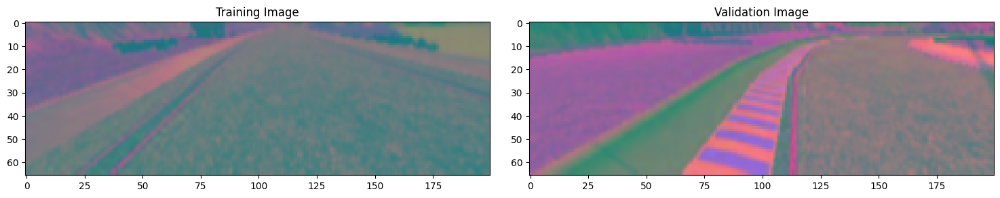

In [53]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

### **MODELO**


In [54]:
def nvidia_model():
  model = tf.keras.Sequential()
  model.add(tf.keras.layers.Convolution2D(24, 5, 5, strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
  model.add(tf.keras.layers.Convolution2D(36, 5, 5, strides=(2, 2), activation='elu'))
  model.add(tf.keras.layers.Convolution2D(48, 5, 5, strides=(2, 2), activation='elu'))
  model.add(tf.keras.layers.Convolution2D(64, 3, 3, activation='elu'))

  model.add(tf.keras.layers.Convolution2D(64, 3, 3, activation='elu'))
  # model.add(tf.keras.layers.Dropout(0.5))


  model.add(tf.keras.layers.Flatten())

  model.add(tf.keras.layers.Dense(100, activation = 'elu'))

  model.add(tf.keras.layers.Dense(50, activation = 'elu'))


  model.add(tf.keras.layers.Dense(10, activation = 'elu'))


  model.add(tf.keras.layers.Dense(1))

  optimizer = Adam(lr=1e-3)
  model.compile(loss='mse', optimizer=optimizer)
  return model

In [55]:
def nvidia_model():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
    model.add(tf.keras.layers.Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
    model.add(tf.keras.layers.Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))
    model.add(tf.keras.layers.Conv2D(64, (3, 3), activation='elu'))
    model.add(tf.keras.layers.Conv2D(64, (3, 3), activation='elu'))
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(100, activation='elu'))
    model.add(tf.keras.layers.Dense(50, activation='elu'))
    model.add(tf.keras.layers.Dense(10, activation='elu'))
    model.add(tf.keras.layers.Dense(1))
    optimizer = tf.keras.optimizers.Adam(lr=1e-3)
    model.compile(loss='mse', optimizer=optimizer)
    return model



In [56]:
model = nvidia_model()
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 3, 20, 64)         27712     
                                                                 
 conv2d_4 (Conv2D)           (None, 1, 18, 64)         36928     
                                                                 
 flatten (Flatten)           (None, 1152)              0         
                                                                 
 dense (Dense)               (None, 100)               1

In [57]:
history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                              steps_per_epoch=300,
                              epochs=10,
                              validation_data=batch_generator(X_valid, y_valid, 100, 0),
                              validation_steps=200,
                              verbose=1,
                              shuffle = 1)

<ipython-input-57-67f6e63165ed>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/10
300/300 [==============================] - 215s 673ms/step - loss: 0.1602 - val_loss: 0.1201
Epoch 2/10
300/300 [==============================] - 201s 671ms/step - loss: 0.1209 - val_loss: 0.1132
Epoch 3/10
300/300 [==============================] - 202s 674ms/step - loss: 0.1099 - val_loss: 0.1037
Epoch 4/10
300/300 [==============================] - 223s 746ms/step - loss: 0.1059 - val_loss: 0.1112
Epoch 5/10
300/300 [==============================] - 200s 670ms/step - loss: 0.1005 - val_loss: 0.1023
Epoch 6/10
300/300 [==============================] - 201s 672ms/step - loss: 0.0985 - val_loss: 0.0967
Epoch 7/10
300/300 [==============================] - 200s 669ms/step - loss: 0.0944 - val_loss: 0.0929
Epoch 8/10
300/300 [==============================] - 223s 745ms/step - loss: 0.0935 - val_loss: 0.0964
Epoch 9/10
300/300 [==============================] - 201s 673ms/step - loss: 0.0896 - val_loss: 0.0934
Epoch 10/10
300/300 [==============================] - 222s 743m

Text(0.5, 0, 'Epoch')

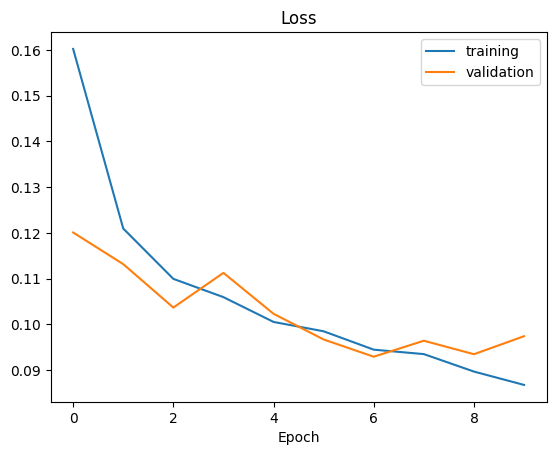

In [58]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [59]:
model.save('model.h5')

In [60]:
from google.colab import files
files.download('model.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### **COMUNICACION CON EL SERVIDOR**

In [ ]:
!pip install eventlet
!pip install python-socketio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import socketio
import eventlet
import numpy as np
from flask import Flask
from keras.models import load_model
import base64
from io import BytesIO
from PIL import Image
import cv2

In [ ]:
sio = socketio.Server()

app = Flask(__name__) #'__main__'
speed_limit = 10
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img, (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

In [ ]:
@sio.on('telemetry')
def telemetry(sid, data):
    speed = float(data['speed'])
    image = Image.open(BytesIO(base64.b64decode(data['image'])))
    image = np.asarray(image)
    image = img_preprocess(image)
    image = np.array([image])
    steering_angle = float(model.predict(image))
    throttle = 1.0 - speed/speed_limit
    print('{} {} {}'.format(steering_angle, throttle, speed))
    send_control(steering_angle, throttle)

In [ ]:
@sio.on('connect')
def connect(sid, environ):
    print('Connected')
    send_control(0, 0)

def send_control(steering_angle, throttle):
    sio.emit('steer', data = {
        'steering_angle': steering_angle.__str__(),
        'throttle': throttle.__str__()
    })

In [ ]:
if __name__ == '__main__':
    model = load_model('model.h5')
    app = socketio.Middleware(sio, app)
    eventlet.wsgi.server(eventlet.listen(('', 4567)), app)

(1138) wsgi starting up on http://0.0.0.0:4567
wsgi exiting
(1138) wsgi exited, is_accepting=True
